# DATA 608 - Assignment 2
Date: 09/17/2021
Written By: Layla Quinones

In [297]:
import multipledispatch
import datashader as ds
import datashader.transfer_functions as tf
import datashader.glyphs
from datashader import reductions
from datashader.core import bypixel
from datashader.utils import lnglat_to_meters as webm, export_image
from datashader.colors import colormap_select, Greys9, viridis, inferno
import copy
import numpy as np

from pyproj import Proj, transform

import pandas as pd
import urllib
import json
import datetime
import colorlover as cl

import plotly.offline as py
import plotly.graph_objs as go
from plotly import tools

# from shapely.geometry import Point, Polygon, shape
# In order to get shapley, you'll need to run [pip install shapely.geometry] from your terminal

from functools import partial

from IPython.display import GeoJSON

#libraries I use for visualizations
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib import cm as cmp
py.init_notebook_mode()

For module 2 we'll be looking at techniques for dealing with big data. In particular binning strategies and the datashader library (which possibly proves we'll never need to bin large data for visualization ever again.)

To demonstrate these concepts we'll be looking at the PLUTO dataset put out by New York City's department of city planning. PLUTO contains data about every tax lot in New York City.

PLUTO data can be downloaded from here. Unzip them to the same directory as this notebook, and you should be able to read them in using this (or very similar) code. Also take note of the data dictionary, it'll come in handy for this assignment.

In [298]:
#Chooseing to read from web for reproducability 
# Code to read in v17, column names have been updated (without upper case letters) for v18

# bk = pd.read_csv('PLUTO17v1.1/BK2017V11.csv')
# bx = pd.read_csv('PLUTO17v1.1/BX2017V11.csv')
# mn = pd.read_csv('PLUTO17v1.1/MN2017V11.csv')
# qn = pd.read_csv('PLUTO17v1.1/QN2017V11.csv')
# si = pd.read_csv('PLUTO17v1.1/SI2017V11.csv')

# ny = pd.concat([bk, bx, mn, qn, si], ignore_index=True)

ny = pd.read_csv('pluto_21v2.csv')


# Getting rid of some outliers
ny = ny[(ny['yearbuilt'] > 1850) & (ny['yearbuilt'] < 2020) & (ny['numfloors'] != 0)]

C:\Users\storm\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3165: DtypeWarning:

Columns (19,20,22,24,26,63,64) have mixed types.Specify dtype option on import or set low_memory=False.



I'll also do some prep for the geographic component of this data, which we'll be relying on for datashader.

You're not required to know how I'm retrieving the lattitude and longitude here, but for those interested: this dataset uses a flat x-y projection (assuming for a small enough area that the world is flat for easier calculations), and this needs to be projected back to traditional lattitude and longitude.

In [112]:
# wgs84 = Proj("+proj=longlat +ellps=GRS80 +datum=NAD83 +no_defs")
# nyli = Proj("+proj=lcc +lat_1=40.66666666666666 +lat_2=41.03333333333333 +lat_0=40.16666666666666 +lon_0=-74 +x_0=300000 +y_0=0 +ellps=GRS80 +datum=NAD83 +to_meter=0.3048006096012192 +no_defs")
# ny['xcoord'] = 0.3048*ny['xcoord']
# ny['ycoord'] = 0.3048*ny['ycoord']
# ny['lon'], ny['lat'] = transform(nyli, wgs84, ny['xcoord'].values, ny['ycoord'].values)

# ny = ny[(ny['lon'] < -60) & (ny['lon'] > -100) & (ny['lat'] < 60) & (ny['lat'] > 20)]

#Defining some helper functions for DataShader
background = "black"
export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

# Part 1: Binning and Aggregation
Binning is a common strategy for visualizing large datasets. Binning is inherent to a few types of visualizations, such as histograms and 2D histograms (also check out their close relatives: 2D density plots and the more general form: heatmaps.

While these visualization types explicitly include binning, any type of visualization used with aggregated data can be looked at in the same way. For example, lets say we wanted to look at building construction over time. This would be best viewed as a line graph, but we can still think of our results as being binned by year:

In [113]:
trace = go.Scatter(
    # I'm choosing BBL here because I know it's a unique key.
    x = ny.groupby('yearbuilt').count()['bbl'].index,
    y = ny.groupby('yearbuilt').count()['bbl']
)

layout = go.Layout(
    xaxis = dict(title = 'Year Built'),
    yaxis = dict(title = 'Number of Lots Built')
)

fig = go.FigureWidget(data = [trace], layout = layout)

fig

FigureWidget({
    'data': [{'type': 'scatter',
              'uid': '868f79f8-2970-4627-9db4-50c5311f143d',
 …

Something looks off... You're going to have to deal with this imperfect data to answer this first question.

But first: some notes on pandas. Pandas dataframes are a different beast than R dataframes, here are some tips to help you get up to speed:

Hello all, here are some pandas tips to help you guys through this homework:

Indexing and Selecting: .loc and .iloc are the analogs for base R subsetting, or filter() in dplyr

Group By: This is the pandas analog to group_by() and the appended function the analog to summarize(). Try out a few examples of this, and display the results in Jupyter. Take note of what's happening to the indexes, you'll notice that they'll become hierarchical. I personally find this more of a burden than a help, and this sort of hierarchical indexing leads to a fundamentally different experience compared to R dataframes. Once you perform an aggregation, try running the resulting hierarchical datafrome through a reset_index().

Reset_index: I personally find the hierarchical indexes more of a burden than a help, and this sort of hierarchical indexing leads to a fundamentally different experience compared to R dataframes. reset_index() is a way of restoring a dataframe to a flatter index style. Grouping is where you'll notice it the most, but it's also useful when you filter data, and in a few other split-apply-combine workflows. With pandas indexes are more meaningful, so use this if you start getting unexpected results.

Indexes are more important in Pandas than in R. If you delve deeper into the using python for data science, you'll begin to see the benefits in many places (despite the personal gripes I highlighted above.) One place these indexes come in handy is with time series data. The pandas docs have a huge section on datetime indexing. In particular, check out resample, which provides time series specific aggregation.

Merging, joining, and concatenation: There's some overlap between these different types of merges, so use this as your guide. Concat is a single function that replaces cbind and rbind in R, and the results are driven by the indexes. Read through these examples to get a feel on how these are performed, but you will have to manage your indexes when you're using these functions. Merges are fairly similar to merges in R, similarly mapping to SQL joins.

Apply: This is explained in the "group by" section linked above. These are your analogs to the plyr library in R. Take note of the lambda syntax used here, these are anonymous functions in python. Rather than predefining a custom function, you can just define it inline using lambda.

Browse through the other sections for some other specifics, in particular reshaping and categorical data (pandas' answer to factors.) Pandas can take a while to get used to, but it is a pretty strong framework that makes more advanced functions easier once you get used to it. Rolling functions for example follow logically from the apply workflow (and led to the best google results ever when I first tried to find this out and googled "pandas rolling")

Google Wes Mckinney's book "Python for Data Analysis," which is a cookbook style intro to pandas. It's an O'Reilly book that should be pretty available out there.

## Question¶

After a few building collapses, the City of New York is going to begin investigating older buildings for safety. The city is particularly worried about buildings that were unusually tall when they were built, since best-practices for safety hadn’t yet been determined. <b> Create a graph that shows how many buildings of a certain number of floors were built in each year (note: you may want to use a log scale for the number of buildings).</b> Find a strategy to bin buildings (It should be clear 20-29-story buildings, 30-39-story buildings, and 40-49-story buildings were first built in large numbers, but does it make sense to continue in this way as you get taller?)

First I want to take a look at the variable names to get an idea of what columns I am interested in for this question, then I want to do some EDA to get an idea of the shape of these variables and their `condition` in terms of NAs and outliers. Based on the code output below we are interested in `numfloors` and `yearbuilt` columns.

In [316]:
#lets take a look at the columns
print(ny.columns)

Index(['borough', 'block', 'lot', 'cd', 'ct2010', 'cb2010', 'schooldist',
       'council', 'zipcode', 'firecomp', 'policeprct', 'healthcenterdistrict',
       'healtharea', 'sanitboro', 'sanitdistrict', 'sanitsub', 'address',
       'zonedist1', 'zonedist2', 'zonedist3', 'zonedist4', 'overlay1',
       'overlay2', 'spdist1', 'spdist2', 'spdist3', 'ltdheight', 'splitzone',
       'bldgclass', 'landuse', 'easements', 'ownertype', 'ownername',
       'lotarea', 'bldgarea', 'comarea', 'resarea', 'officearea', 'retailarea',
       'garagearea', 'strgearea', 'factryarea', 'otherarea', 'areasource',
       'numbldgs', 'numfloors', 'unitsres', 'unitstotal', 'lotfront',
       'lotdepth', 'bldgfront', 'bldgdepth', 'ext', 'proxcode', 'irrlotcode',
       'lottype', 'bsmtcode', 'assessland', 'assesstot', 'exempttot',
       'yearbuilt', 'yearalter1', 'yearalter2', 'histdist', 'landmark',
       'builtfar', 'residfar', 'commfar', 'facilfar', 'borocode', 'bbl',
       'condono', 'tract2010', 'xcoo

In [103]:
#lets take a look at the shape of numfloors
ny['numfloors'].describe()

count    810654.000000
mean          2.458216
std           1.950297
min           0.100000
25%           2.000000
50%           2.000000
75%           2.500000
max         104.000000
Name: numfloors, dtype: float64

In [104]:
#lets take a look at the shape of yearbuilt
ny['yearbuilt'].describe()

count    810654.000000
mean       1941.069113
std          30.493790
min        1851.000000
25%        1920.000000
50%        1931.000000
75%        1960.000000
max        2019.000000
Name: yearbuilt, dtype: float64

In [64]:
#Lets look at the number of unique values for years = 169 years
ny['yearbuilt'].value_counts()

1920.0    87855
1930.0    75102
1925.0    69695
1950.0    46835
1910.0    42076
          ...  
1859.0      108
1858.0      106
1851.0       89
1863.0       67
1862.0       60
Name: yearbuilt, Length: 169, dtype: int64

In [105]:
#Lets look at the number of unique values for num floors = 181 values
ny['numfloors'].value_counts()

2.00     415755
3.00     119394
2.50      81790
1.00      74205
4.00      28004
          ...  
3.30          1
90.00         1
5.09          1
1.17          1
1.01          1
Name: numfloors, Length: 181, dtype: int64

We can see from printing out the statistics and unqie values that there are some years missing in this dataset. This means that when we begin graphing our data we'll have to choose bins for years accordingly so that we can get an accurate and insightfult visualization. Below I tried to visualize the distribution of the the number of floors in buildings built grouped by year. We have way too many single years and can barely see anything but we can tell that as years increase so does the number of tall buildings built however, they seem like outliers compared to the first half of the dataset. We can see that there are many buildings in the lower half of the `numfloors` range which indicates that a log transformation of the `numfloors` variable may be helpful for our visualization. In addition, we may want to bin t he years by every 5 or 10 years due to missing years in the `yearbuilt` column. 

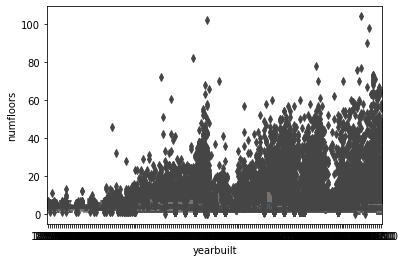

In [318]:
#Looking at the number of floors of buildings by year
#BOXPLOT TO TRY TO SEE DISTRIBUTION
sns.boxplot(x = 'yearbuilt', y = 'numfloors', data = ny)
plt.show()

Next I wanted to visualize the number of buildings built in each year regardless of the number of floors to get a sense of the density of buildings being built each year. We can see that there were years in the 1920s that many buildings were built in a short span of years. I then took a look at the number of buildings built with specific number of floors and it became apparent with that histagram that a log transformation for the `numfloors` variable would be appropriate for the visualization I am trying to create.

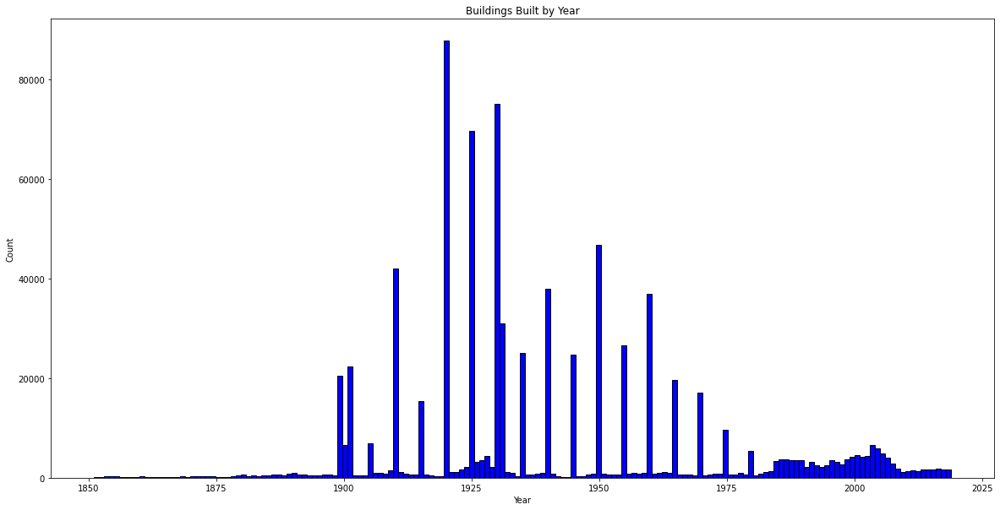

In [319]:
#Set Size
plt.figure(figsize=(20,10))

#histagram of years and number of buildings
plt.hist(ny['yearbuilt'], color = 'blue', edgecolor = 'black',
         bins = len(ny['yearbuilt'].value_counts()))

# Add labels
plt.title('Buildings Built by Year')
plt.xlabel('Year')
plt.ylabel('Count')
plt.show()

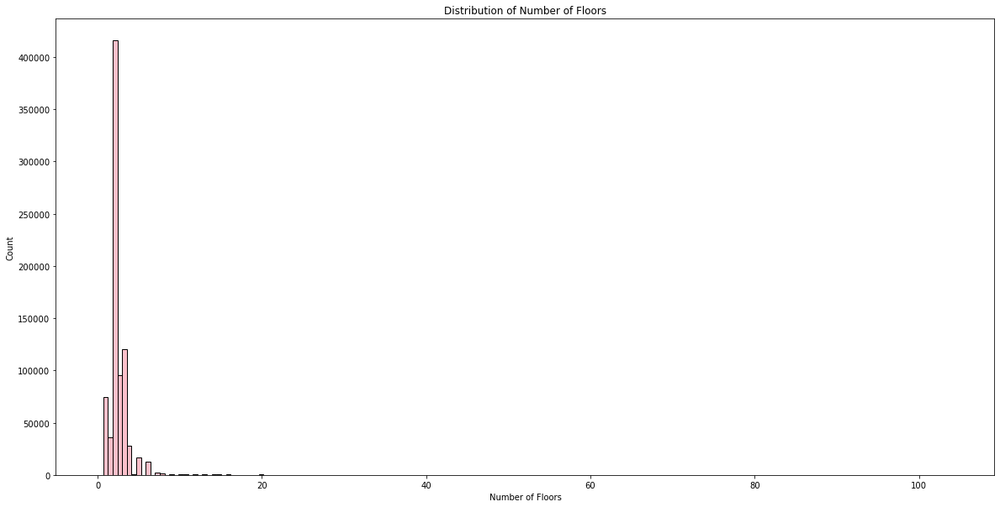

In [320]:
#Set Size
plt.figure(figsize=(20,10))

#histagram of years and number of building
plt.hist(ny['numfloors'], color = 'pink', edgecolor = 'black',
         bins = len(ny['numfloors'].value_counts()))

# Add labels
plt.title('Distribution of Number of Floors')
plt.xlabel('Number of Floors')
plt.ylabel('Count')
plt.show()

In [322]:
#Apply log transformation
ny['logNumFloors'] = np.log(ny['numfloors'])

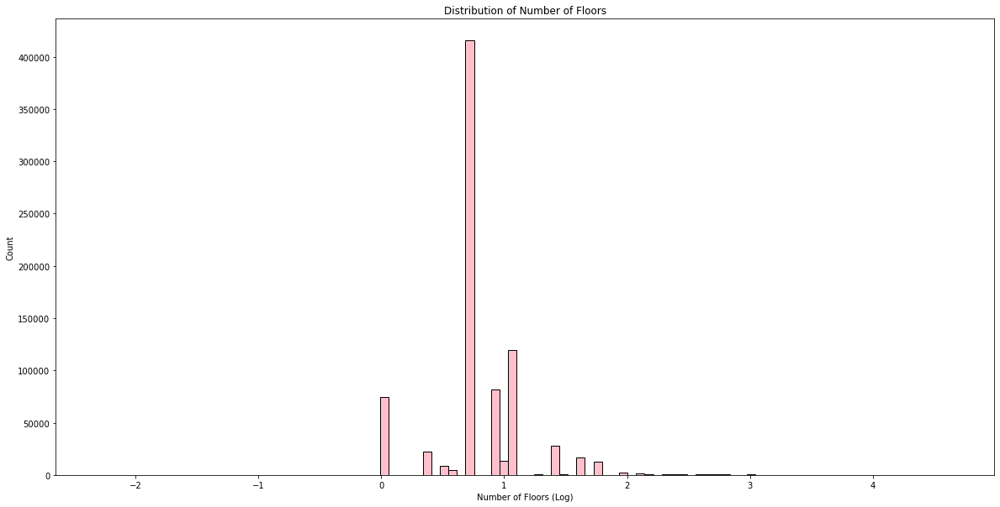

In [323]:
#Set Size
plt.figure(figsize=(20,10))

#histagram of years and number of building
plt.hist(ny['logNumFloors'], color = 'pink', edgecolor = 'black', bins = 100)

# Add labels
plt.title('Distribution of Number of Floors')
plt.xlabel('Number of Floors (Log)')
plt.ylabel('Count')
plt.show()

Now that we have transformed the `numfloors` axis, we can create bins for them. The histagram above shows that possibly binning the number for floors by 10's up to 50 then binning the rest of the buildings built with greater than 50 floors will be helpful for visualizing such a range of numbers. Below I created a function that generates a new column in our dataframe that has the label for each bin that each building falls into. 

In [325]:
#lets create a new column with the label for buildings between 
#A:0-10 floors
#C: 10 - 20 floors
#D: 20 - 30 floors
#E: 30 - 40 floors
#F: 40 - 50
#G: 50 +
#Label function
def label_floors (row):
    if row['numfloors'] <= 10 :
      return '1-10'
    elif row['numfloors'] > 10 and row['numfloors'] < 21 :
      return '11-20'
    elif row['numfloors'] > 20 and row['numfloors'] < 31 :
      return '21-30'
    elif row['numfloors'] > 30 and row['numfloors'] < 41 :
      return '31 - 40'
    elif row['numfloors'] > 40 and row['numfloors'] < 51 :
      return '41 - 50'
    elif row['numfloors'] > 50:
      return '51 +'
# call function
ny['floorLabel'] = ny.apply (lambda row: label_floors(row), axis=1)

#display
ny['floorLabel'].head()

1    1-10
2    1-10
3    1-10
4    1-10
5    1-10
Name: floorLabel, dtype: object

We also have to do something similar for the years axis as well in that we will be binning each year by 10 so we can visualize the number of buildings built within a decade that fall within a specific number of floors category.

In [326]:
#Looking at the range here
print(ny['yearbuilt'].describe())

count    810654.000000
mean       1941.069113
std          30.493790
min        1851.000000
25%        1920.000000
50%        1931.000000
75%        1960.000000
max        2019.000000
Name: yearbuilt, dtype: float64


In [329]:
#lets create a new column with the label for decades beggining in 1850
#1860: 1851 - 1860
#1870: 1861 - 1870
#1880: 1871 - 1880 
#... ETC
yearLabels = pd.Series(np.arange(1860,2030,10))
yearEdges = pd.Series(np.arange(1849,2029,10))

#create a new column with labels
ny['yearLabel'] = pd.cut(ny['yearbuilt'], bins=yearEdges, labels=yearLabels)

Now that we have the data labeled and organized we can create a more understandable visualization by using bar charts and stacking the various groups. 

In [330]:
#Filter the data, group by year and number of floors and add new column to count the 
#number of rows in each category
yearFloor = ny.filter(['yearbuilt', 'yearLabel','numfloors', 'floorLabel'])
yearFloor = yearFloor.groupby(['yearLabel', 'floorLabel']).size().reset_index(name='count')

#Lets take a look
print (yearFloor.head())

  yearLabel floorLabel  count
0      1860       1-10   1552
1      1860      11-20      1
2      1860      21-30      0
3      1860    31 - 40      0
4      1860    41 - 50      0


In [41]:
#Lets graph is as it is before we apply the log transformation just to apreciate the differences
#Stacked barchart using Ploty express
figOne = px.bar(yearFloor, x="yearLabel", y="count", color="floorLabel",
               color_discrete_sequence=px.colors.qualitative.Set3,
               height=800,
               title="Buildings Built in New York City",
               labels={
                  "yearLabel": "Year (by decade)",
                  "count": "Count",
                  "floorLabel": "Number of Floors"
               })

# Legend
figOne.update_layout(legend_traceorder="reversed", title_x=0.5)
figOne.show()

We can see that without grouping together the number of floors the scale doesnt allow us to see anything but the buildings in group 1 - 9 floors because the distribution is so skewed.

### Solution

The following visualization displays the number of buildings and corresponding number of floors built in New York City grouped by decade from 1851 - 2020. Each bar represents the number of buildings built the decade before the labled year. For example, buildings built from `1931 - 1940` will be included in the bar labeled `1940`.  The axis indicating the number of buildings displays the log base 10 transformation for the number of buildings in that category for that year. This means that the axis is skewed a bit and relative sized of bar sections are not to be compared to others within the same year. It is useful to compare sections with the same color to see how much the number of buildings in that floor category has changed throughout the years. Using `plotly express`, visualizations are generated that provided metadata if the user hovers over a section. This is super helpful for those who wish to dig deeper into the data for each section. It is nessesary to note that due to the log transformation some insights may seem misleading. For example, the graph below seems to show that more buildings were consturcted during decade leading to 2020 than any other year, however during our initial EDA we discovered that most buildings were built in the decade leading to 1930 (as seen in the orginial bar chart). When presenting such a visualization it is important that you let the viewer know that it is `NOT TO SCALE` due to the log transformation.

In [331]:
#Drop zeros
yearFloor.drop(yearFloor.loc[yearFloor['count']==0].index, inplace=True)

#Log transformation
yearFloor['logCount'] = np.log10(yearFloor['count'])

# sort
yearFloor.sort_values('floorLabel', inplace=True)

#display
yearFloor.head()

,yearLabel,floorLabel,count,logCount
0,1860,1-10,1552,3.190892
96,2020,1-10,14817,4.170760
90,2010,1-10,42519,4.628583
84,2000,1-10,28803,4.459438
78,1990,1-10,26853,4.428993


In [332]:
# Log transformed stacked barchart using Ploty express
figTwo = px.bar(yearFloor, x="yearLabel", y="logCount", color="floorLabel",
               color_discrete_sequence=px.colors.qualitative.Set3,
               height=800,
               title="Buildings Built in New York City (Transformed)",
               labels={
                  "yearLabel": "Year (by decade)",
                  "count": "Count (log transformed)",
                  "floorLabel": "Number of Floors"
               })

# Legend
figTwo.update_layout(legend_traceorder="reversed", title_x=0.5)
figTwo.show()

# Part 2: Datashader

Datashader is a library from Anaconda that does away with the need for binning data. It takes in all of your datapoints, and based on the canvas and range returns a pixel-by-pixel calculations to come up with the best representation of the data. In short, this completely eliminates the need for binning your data.

As an example, lets continue with our question above and look at a 2D histogram of YearBuilt vs NumFloors:

In [49]:
fig = go.FigureWidget(
    data = [
        go.Histogram2d(x=ny['yearbuilt'], y=ny['numfloors'], autobiny=False, ybins={'size': 1}, colorscale='Greens')
    ]
)

fig

FigureWidget({
    'data': [{'autobiny': False,
              'colorscale': [[0.0, 'rgb(247,252,245)'], [0.125…

This shows us the distribution, but it's subject to some biases discussed in the Anaconda notebook <a href = "https://anaconda.org/jbednar/plotting_pitfalls/notebook"> Plotting Perils </a>. Here is what the same plot would look like in datashader:

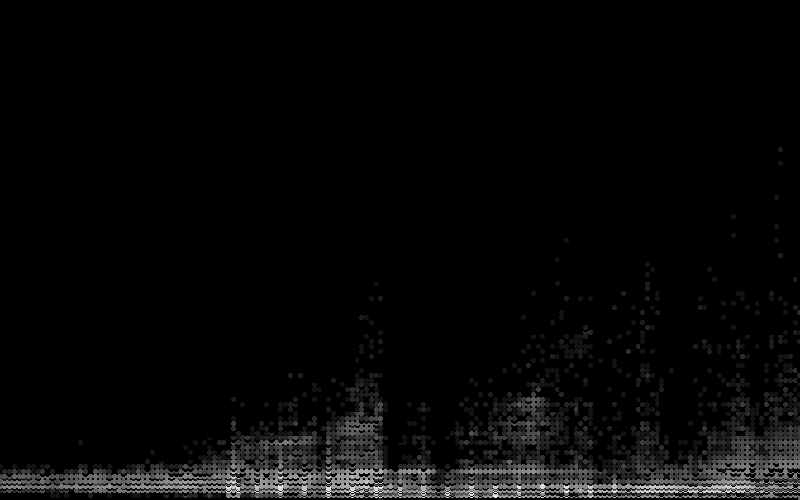

In [50]:
#Defining some helper functions for DataShader
background = "black"
export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

cvs = ds.Canvas(800, 500, x_range = (ny['yearbuilt'].min(), ny['yearbuilt'].max()), 
                                y_range = (ny['numfloors'].min(), ny['numfloors'].max()))
agg = cvs.points(ny, 'yearbuilt', 'numfloors')
view = tf.shade(agg, cmap = cm(Greys9), how='log')
export(tf.spread(view, px=2), 'yearvsnumfloors')

That's technically just a scatterplot, but the points are smartly placed and colored to mimic what one gets in a heatmap. Based on the pixel size, it will either display individual points, or will color the points of denser regions.

Datashader really shines when looking at geographic information. Here are the latitudes and longitudes of our dataset plotted out, giving us a map of the city colored by density of structures:

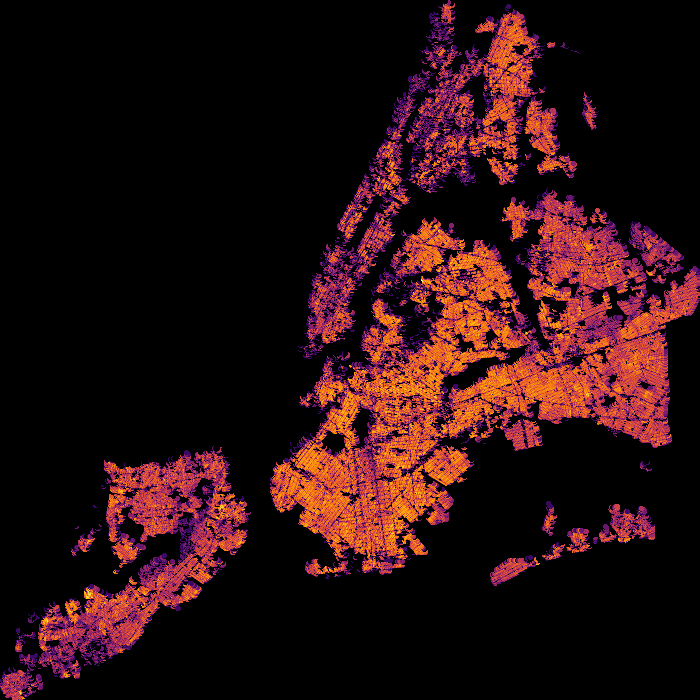

In [51]:
NewYorkCity   = (( 913164.0,  1067279.0), (120966.0, 272275.0))
cvs = ds.Canvas(700, 700, *NewYorkCity)
agg = cvs.points(ny, 'xcoord', 'ycoord')
view = tf.shade(agg, cmap = cm(inferno), how='log')
export(tf.spread(view, px=2), 'firery')

Interestingly, since we're looking at structures, the large buildings of Manhattan show up as less dense on the map. The densest areas measured by number of lots would be single or multi family townhomes.

Unfortunately, Datashader doesn't have the best documentation. Browse through the examples from their github repo. I would focus on the visualization pipeline and the US Census Example for the question below. Feel free to use my samples as templates as well when you work on this problem.

## Question
You work for a real estate developer and are researching underbuilt areas of the city. After looking in the Pluto data dictionary, you've discovered that all tax assessments consist of two parts: The assessment of the land and assessment of the structure. You reason that there should be a correlation between these two values: more valuable land will have more valuable structures on them (more valuable in this case refers not just to a mansion vs a bungalow, but an apartment tower vs a single family home). Deviations from the norm could represent underbuilt or overbuilt areas of the city. You also recently read a really cool blog post about bivariate choropleth maps, and think the technique could be used for this problem.

Datashader is really cool, but it's not that great at labeling your visualization. Don't worry about providing a legend, but provide a quick explanation as to which areas of the city are overbuilt, which areas are underbuilt, and which areas are built in a way that's properly correlated with their land value.

First I visualized the variables to see which ones I am interested in looking at. From the output of columns below we see that the only place where assessment data is stored is in the columns listed as `assessland` anbd `assesstot`.

In [333]:
#lets take a look at the columns again to see which variables describe the assessment of land and structure
ny.columns

Index(['borough', 'block', 'lot', 'cd', 'ct2010', 'cb2010', 'schooldist',
       'council', 'zipcode', 'firecomp', 'policeprct', 'healthcenterdistrict',
       'healtharea', 'sanitboro', 'sanitdistrict', 'sanitsub', 'address',
       'zonedist1', 'zonedist2', 'zonedist3', 'zonedist4', 'overlay1',
       'overlay2', 'spdist1', 'spdist2', 'spdist3', 'ltdheight', 'splitzone',
       'bldgclass', 'landuse', 'easements', 'ownertype', 'ownername',
       'lotarea', 'bldgarea', 'comarea', 'resarea', 'officearea', 'retailarea',
       'garagearea', 'strgearea', 'factryarea', 'otherarea', 'areasource',
       'numbldgs', 'numfloors', 'unitsres', 'unitstotal', 'lotfront',
       'lotdepth', 'bldgfront', 'bldgdepth', 'ext', 'proxcode', 'irrlotcode',
       'lottype', 'bsmtcode', 'assessland', 'assesstot', 'exempttot',
       'yearbuilt', 'yearalter1', 'yearalter2', 'histdist', 'landmark',
       'builtfar', 'residfar', 'commfar', 'facilfar', 'borocode', 'bbl',
       'condono', 'tract2010', 'xcoo

In [334]:
# Looking at the shape of these variables 
ny['assessland'].describe()

count    8.106540e+05
mean     1.107072e+05
std      4.088922e+06
min      0.000000e+00
25%      1.038000e+04
50%      1.416000e+04
75%      2.190000e+04
max      3.205634e+09
Name: assessland, dtype: float64

In [59]:
ny['assesstot'].describe()

count    8.106540e+05
mean     4.819847e+05
std      1.078787e+07
min      0.000000e+00
25%      3.846000e+04
50%      5.370000e+04
75%      9.408000e+04
max      7.329049e+09
Name: assesstot, dtype: float64

In [60]:
# Looking at unique values
ny['assessland'].value_counts()

37560.0        1671
35880.0        1482
34260.0        1417
35100.0        1343
38040.0        1311
               ... 
3137853.0         1
6549300.0         1
16051950.0        1
10969200.0        1
162364950.0       1
Name: assesstot, Length: 31894, dtype: int64

In [335]:
ny['assesstot'].value_counts()

37560.0        1671
35880.0        1482
34260.0        1417
35100.0        1343
38040.0        1311
               ... 
3137853.0         1
6549300.0         1
16051950.0        1
10969200.0        1
162364950.0       1
Name: assesstot, Length: 31894, dtype: int64

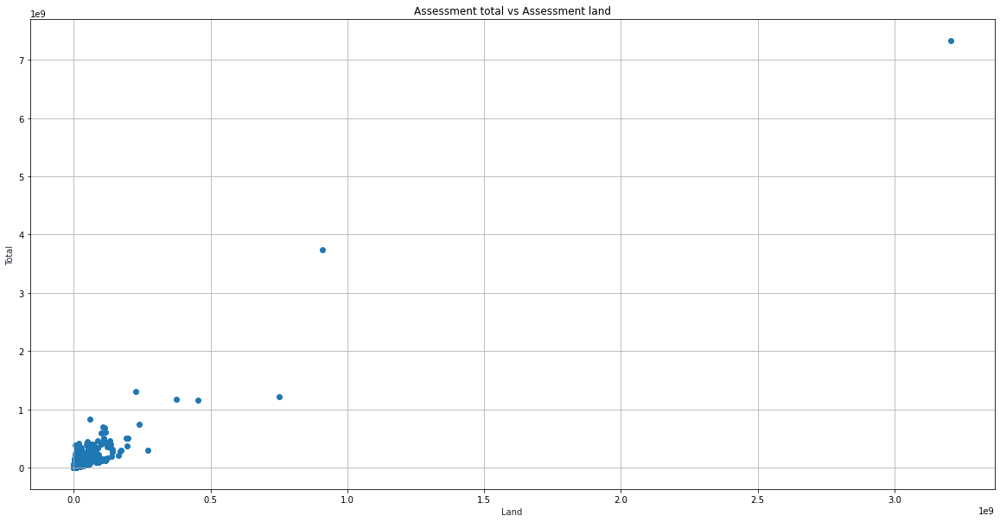

In [336]:
#Lets take a look at the relationship between these variables
# Regular Plot
plt.figure(figsize=(20,10))
plt.scatter(ny['assessland'], ny['assesstot'])
plt.title('Assessment total vs Assessment land')
plt.xlabel('Land', color='#1C2833')
plt.ylabel('Total', color='#1C2833')
plt.grid()
plt.show()

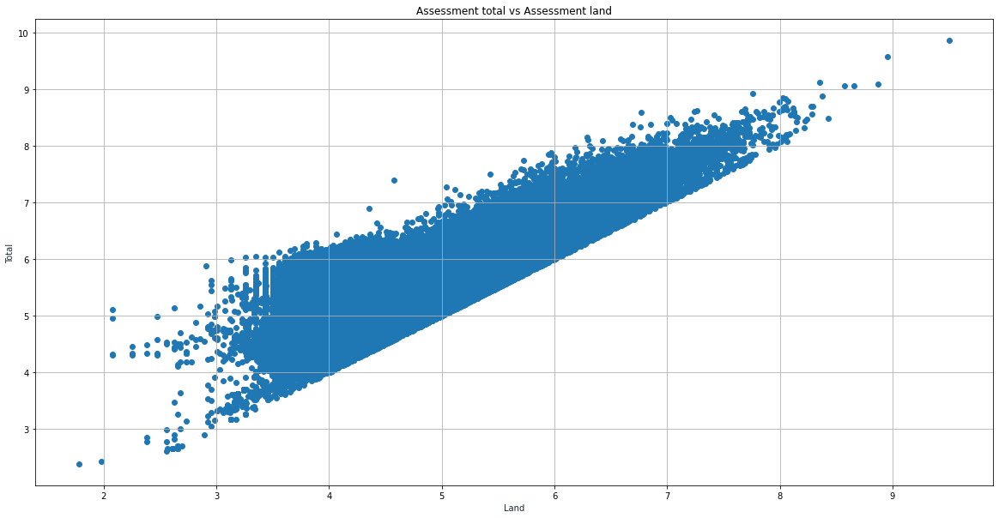

In [342]:
#remove zeros
ny.drop(ny.loc[ny['assessland']==0].index, inplace=True)
ny.drop(ny.loc[ny['assesstot']==0].index, inplace=True)

#Log Transformed Plot
plt.figure(figsize=(20,10))
plt.scatter(np.log10(ny['assessland']), np.log10(ny['assesstot']))
plt.title('Assessment total vs Assessment land')
plt.xlabel('Land', color='#1C2833')
plt.ylabel('Total', color='#1C2833')
plt.grid()
plt.show()

Lets generate heatmaps for these varables to see what we can tell. The assessment total encompasses a combination of the land assessment and structure assessmenmt and we can see from the graph above that they are correlated - we will assume that this relationship is linear.

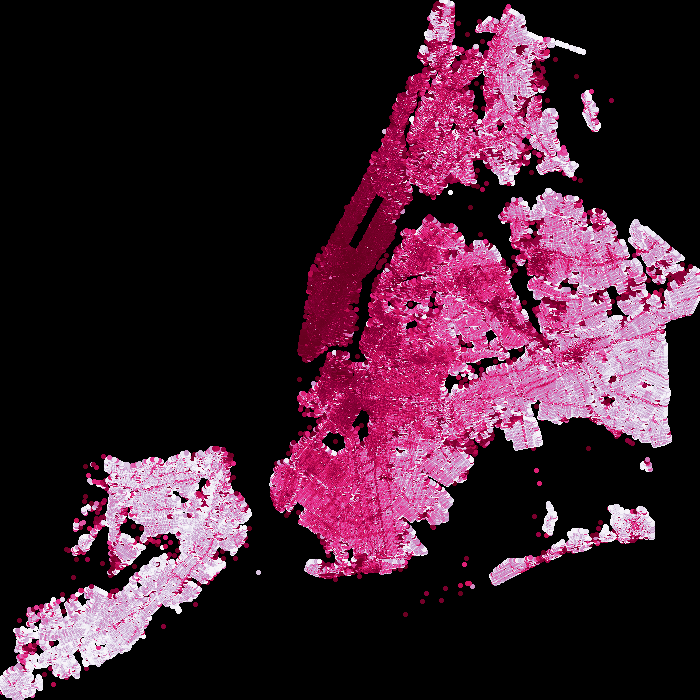

In [340]:
#Graph total assessment (not mean)
agg2 = cvs2.points(ny, 'xcoord', 'ycoord', ds.sum('assesstot'))
view2 = tf.shade(agg2, cmap = cm.PuRd, how = 'eq_hist')
export(tf.spread(view2, px=2), 'Assessment Total')

Initially I used the mean instead of the sum because I felt that it looked clearer, however I realized that the mean will not give me the information I am looking for. We should use the sum in this case because we are trying to identify overbuilt and underbuilt areas in the city and will need information about all buildings that were built. Now lets seperate 'assesstot' into its constituants to get a measure for structure assessment. Below you can see that we create our own metric called 'aStruc' which is the assessment of the sturcture that was built. Based on our asserting that these two quantaties are correlated, we can derive the building structure by subtracting the land assessment from the total assessment. 

In [343]:
#subtract the raw score 
ny['aStruc'] = ny['assesstot'] - ny['assessland']

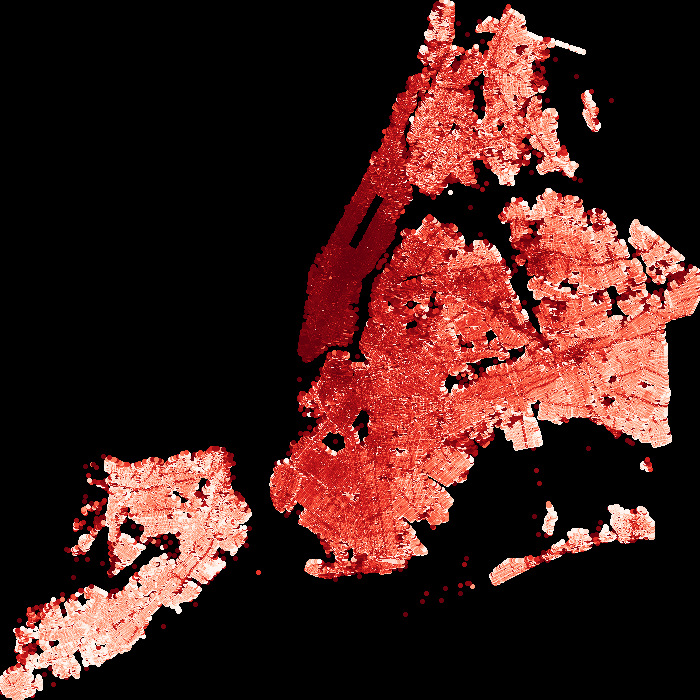

In [344]:
# Land Assessment 
cvs3 = ds.Canvas(700, 700, *NewYorkCity)
agg3 = cvs3.points(ny, 'xcoord', 'ycoord', ds.sum('assessland'))
view3 = tf.shade(agg3, cmap = cm.Reds)
export(tf.spread(view3, px=2), 'Assessment Land')

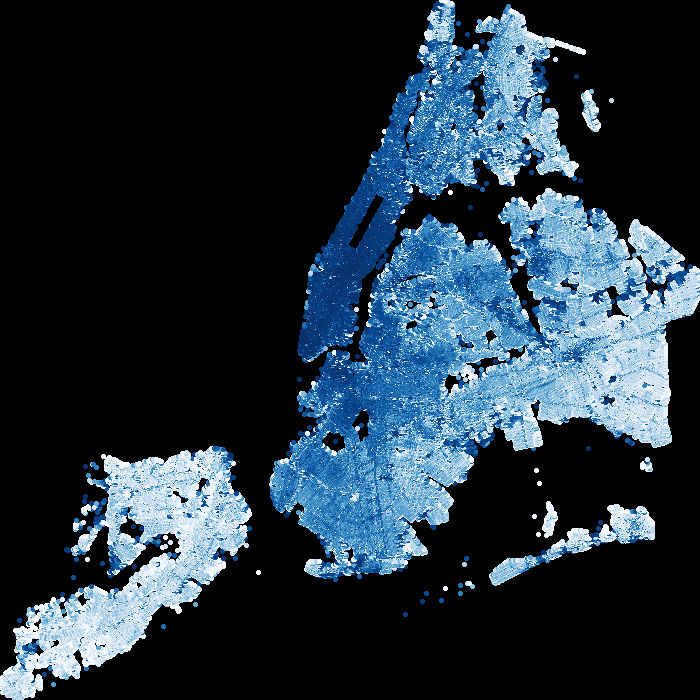

In [345]:
#Building Structure Assessment
cvs4 = ds.Canvas(700, 700, *NewYorkCity)
agg4 = cvs4.points(ny, 'xcoord', 'ycoord', ds.sum('aStruc'))
view4 = tf.shade(agg4, cmap = cm.Blues)
export(tf.spread(view4, px=2), 'Assessment Structure')

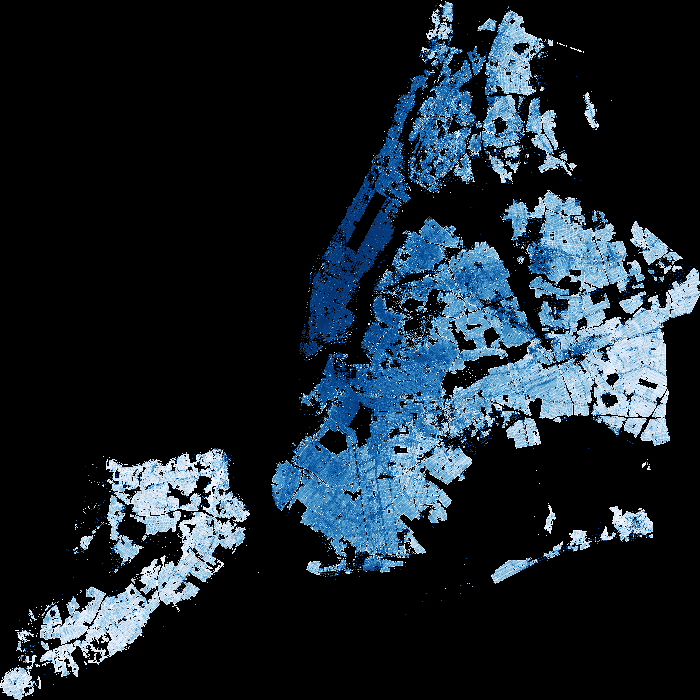

In [346]:
view5 = tf.stack(view3 , view4, how = 'over')
export(view5, 'Sum of Land & Structure Assessments')

With the above overlay we can barely see the areas that are over built and the areas that are underbuilt. We are missing definitions for overbuilt and underbuilt areas in terms of these numbers. We should take a look at the shape of the data and define thresholds for each of these categories.

In [347]:
#Lets take a look at the spread of these
ny['assessland'].describe()

count    8.105900e+05
mean     1.107159e+05
std      4.089083e+06
min      6.000000e+01
25%      1.038000e+04
50%      1.416000e+04
75%      2.190000e+04
max      3.205634e+09
Name: assessland, dtype: float64

In [348]:
ny['aStruc'].describe()

count    8.105900e+05
mean     3.713049e+05
std      7.091637e+06
min      0.000000e+00
25%      2.664000e+04
50%      3.888000e+04
75%      7.116000e+04
max      4.123415e+09
Name: aStruc, dtype: float64

In [349]:
#we'll seperate into 4 categories for each section land and structure
landBins = ['A', 'B', 'C', 'D']
strucBins = [0,1,2,3]

#Create a new columns for labels
ny['landRating'] = 'A' #initial values
ny['strucRating'] = 0 #initial values

#set conditions for labels
ny.loc[ny['assessland'] >= 21900.0, 'landRating'] = 'D'
ny.loc[(ny['assessland'] >= 14160.0) & (ny['assessland'] < 21900.0) , 'landRating'] = 'C'
ny.loc[(ny['assessland'] >= 10380) & (ny['assessland']< 14160) , 'landRating'] = 'B'
ny.loc[(ny['assessland'] < 10380) , 'landRating'] = 'A'

ny.loc[ny['aStruc'] >= 71160, 'strucRating'] = 3
ny.loc[(ny['aStruc'] >= 38800) & (ny['aStruc'] < 71160) , 'strucRating'] = 2
ny.loc[(ny['aStruc'] >= 26640) & (ny['aStruc'] < 38800) , 'strucRating'] = 1
ny.loc[(ny['aStruc'] < 26640) , 'strucRating'] = 0

#One more column to define the combination of both classes
# Concatenate the land and building labels
ny['combinedRating'] = ny['landRating'].astype(str) + ny['strucRating'].astype(str)
ny['combinedRating'] = pd.Categorical(ny['combinedRating'])

In [352]:
#take a look (LOOKS GOOD)
print(ny['combinedRating'].head)

<bound method NDFrame.head of 1         D3
2         D3
3         D3
4         D3
5         A1
          ..
858116    B0
858119    C1
858134    A0
858152    C0
858187    B2
Name: combinedRating, Length: 810590, dtype: category
Categories (16, object): ['A0', 'A1', 'A2', 'A3', ..., 'D0', 'D1', 'D2', 'D3']>


In [361]:
#Set up color schemes we'll need 16
colors = {
    'A0': '#FF3333',
    'A1': '#FF832E',
    'A2': '#FFBE33',
    'A3': '#A0FF33',
    'B0': '#029B02',
    'B1': '#2EFFEE',
    'B2': '#2EAEFF',
    'B3': '#2E40FF',
    'C0': '#7B2EFF',
    'C1': '#ED2EFF',    
    'C2': '#FF2E83',
    'C3': '#FCFF33',
    'D0': '#F790DE',
    'D1': '#F6D2ED',
    'D2': '#F6D2DD',
    'D3': '#FFC0C0'
}

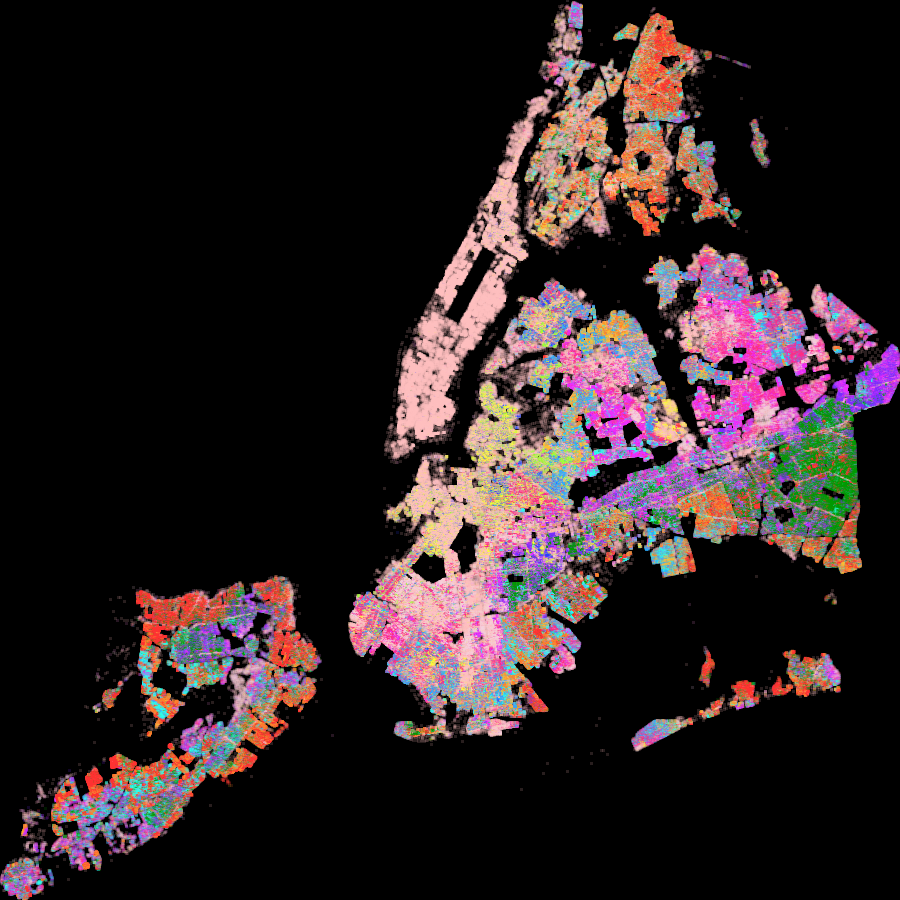

In [360]:
#Plot
cvs6 = ds.Canvas(900, 900, *NewYorkCity)
agg6 = cvs6.points(ny, 'xcoord', 'ycoord', ds.count_cat('combinedRating'))
view6 = tf.shade(agg6, color_key = colors)
export(tf.spread(view6, px=1), 'pretty_colors')

In the above visualization can be interpreted by category: Reds correspond to A group; Blues correspond to the B group; Purples correspond to the C group and light pinks correspond to the D group. These letters correspond to the `landRating` variable which gives an assessment for the land value. As for the intensity of the colors, they correspond to the number category which indicated the assessment score for the structures that are built in each area. From the above map we can see that Manhattan and Western brooklyn contains much of the land and structures that have the highest assessment rating. We can consider these areas overbuilt. For the most part Queens and Brooklyn are not overbuilt or underbuilt as we can see from the purples. We see many areas in Queens have high land ratings and low structure ratings. In Staten Island, the Bronx and Long island, we see large areas with red which may indicate underbuilt areas. Interestingly enough these areas correspond to airports, factories and lots - which makes sense that those areas would have low building and low land value. 